In [1]:
import os

# Sette miljøvariabler for DINOv3
# Dette bruker vi nedenfor for å finne nedlastede repoet: Du må skrive din egen sti her
os.environ["DINOV3_LOCATION"] = "D:/Dinov3"
print("DINOV3_LOCATION:", os.getenv("DINOV3_LOCATION"))

DINOV3_LOCATION: D:/Dinov3


In [2]:
# Laste ned alle pakkene som trengs: 
#%pip install torch torchvision pillow numpy matplotlib scipy scikit-learn tqdm


In [3]:
#importere nødvendige biblioteker

import io
import os
import pickle
import tarfile
import urllib

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.linear_model import LogisticRegression
import torch
import torchvision.transforms.functional as TF
from tqdm import tqdm



In [4]:
# sett DINOv3 location til miljøvariabelen

DINOV3_LOCATION = os.getenv("DINOV3_LOCATION")

if DINOV3_LOCATION is None:
    raise ValueError("DINOV3_LOCATION environment variabel er ikke satt. Se tidligere steg.")

print("DINOv3 location set to:", DINOV3_LOCATION)

DINOv3 location set to: D:/Dinov3


In [5]:

# Vi starer med denne, da denne er minst og krever mindre ressurser
MODEL_DINOV3_VITS = "dinov3_vits16"

# Andre modeller du kan prøve
# Husk at du må laste ned "weights" for den modellen du ønsker å bruke
MODEL_DINOV3_VITSP = "dinov3_vits16plus"
MODEL_DINOV3_VITB = "dinov3_vitb16"
MODEL_DINOV3_VITL = "dinov3_vitl16"
MODEL_DINOV3_VITHP = "dinov3_vith16plus"
MODEL_DINOV3_VIT7B = "dinov3_vit7b16"

# we take DINOv3 ViT-S (since we have the pretrained weights for this model)
MODEL_NAME =  MODEL_DINOV3_VITB # Her kan du velge en annen modell 

# Load model without pretrained weights to avoid web download
model = torch.hub.load(
    repo_or_dir=DINOV3_LOCATION,
    model=MODEL_NAME,
    source="local",
    pretrained=True 
)

# Set model to evaluation mode and move to GPU
model.eval()
model.cuda()

# Test the model with a small dummy input to see if it produces valid output
print("\nTesting model with dummy input...")
dummy_input = torch.randn(1, 3, 224, 224).cuda()
with torch.no_grad():
    try:
        test_output = model(dummy_input)
        print(f"Model test successful. Output shape: {test_output.shape}")
        print(f"Output has NaN: {torch.isnan(test_output).any()}")
        print(f"Output range: {test_output.min():.4f} to {test_output.max():.4f}")
    except Exception as e:
        print(f"Model test failed: {e}")
        print("There might be an issue with the model or checkpoint loading.")


Testing model with dummy input...
Model test successful. Output shape: torch.Size([1, 768])
Output has NaN: False
Output range: -2.1414 to 2.1537


In [6]:

# Bruke bilder som er lagret lokalt på på "data" mappen
image_folder = "./Treningsdata"
label_folder = "./Treningsdata_Masked"

def load_images_from_folder(folder: str) -> list[Image.Image]:
    images = []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            img = Image.open(os.path.join(folder, filename))
            images.append(img)
            print(f"Loaded {filename} from {folder}")

    print(f"Total images loaded from {folder}: {len(images)}\n")
    return images

images = load_images_from_folder(image_folder)
labels = load_images_from_folder(label_folder)
n_images = len(images)

assert n_images == len(labels), f"{len(images)=}, {len(labels)=}" # Sjekke at vi har like mange bilder og labels

print(f"Loaded {n_images} images and labels from local folders")




Loaded Image01.png from ./Treningsdata
Loaded Image02.png from ./Treningsdata
Loaded Image03.png from ./Treningsdata
Loaded Image04.png from ./Treningsdata
Loaded Image05.png from ./Treningsdata
Loaded Image06.png from ./Treningsdata
Loaded Image07.png from ./Treningsdata
Loaded Image08.png from ./Treningsdata
Loaded Image09.png from ./Treningsdata
Loaded Image10.png from ./Treningsdata
Total images loaded from ./Treningsdata: 10

Loaded Label01.png from ./Treningsdata_Masked
Loaded Label02.png from ./Treningsdata_Masked
Loaded Label03.png from ./Treningsdata_Masked
Loaded Label04.png from ./Treningsdata_Masked
Loaded Label05.png from ./Treningsdata_Masked
Loaded Label06.png from ./Treningsdata_Masked
Loaded Label07.png from ./Treningsdata_Masked
Loaded Label08.png from ./Treningsdata_Masked
Loaded Label09.png from ./Treningsdata_Masked
Loaded Label10.png from ./Treningsdata_Masked
Total images loaded from ./Treningsdata_Masked: 10

Loaded 10 images and labels from local folders


In [7]:
# Konstanter for patch-størrelse og bilde-størrelse

PATCH_SIZE = 16    # Hver patch er 16×16 piksler
IMAGE_SIZE = 768*1.5   # Standard høyde vi skalerer til (768÷16 = 48 patches høyt)

In [8]:
patch_quant_filter = torch.nn.Conv2d(1, 1, PATCH_SIZE, stride=PATCH_SIZE, bias=False)
patch_quant_filter.weight.data.fill_(1.0 / (PATCH_SIZE * PATCH_SIZE)) # Fyller data med 1/(16*16)= 0.00390625


tensor([[[[0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039],
          [0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039, 0.0039,
           0.0039, 

In [9]:
# Denne funksjonen bruker vi videre for å endre størrelse på maskene slik at de passer med patch-størrelsen
def resize_transform(mask_image: Image, image_size: int = IMAGE_SIZE, patch_size: int = PATCH_SIZE) -> torch.Tensor:
    w, h = mask_image.size                              # Original størrelse
    h_patches = int(image_size / patch_size)            # Antall patches vertikalt (768÷16=48)
    w_patches = int((w * image_size) / (h * patch_size)) # Antall patches horisontalt
    return TF.to_tensor(TF.resize(mask_image, (h_patches * patch_size, w_patches * patch_size)))

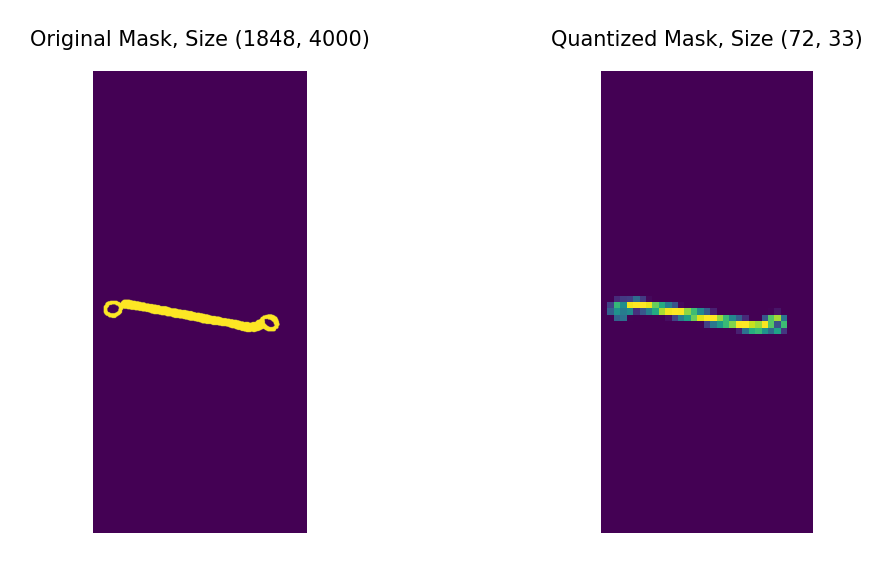

In [10]:
# Her henter vi en maske og viser original og kvantisert maske
# Vi splitter masken i ulike kanaler (RGBA) og bruker bare alpha-kanalen som er siste kanal
mask_0 = labels[1].split()[-1] 
mask_0_resized = resize_transform(mask_0)

with torch.no_grad():
    mask_0_quantized = patch_quant_filter(mask_0_resized).squeeze().detach().cpu()

plt.figure(figsize=(4, 2), dpi=300)
plt.subplot(1, 2, 1)
plt.imshow(mask_0)
plt.axis('off')
plt.title(f"Original Mask, Size {mask_0.size}", fontsize=5)
plt.subplot(1, 2, 2)
plt.imshow(mask_0_quantized)
plt.axis('off')
plt.title(f"Quantized Mask, Size {tuple(mask_0_quantized.shape)}", fontsize=5)
plt.show()

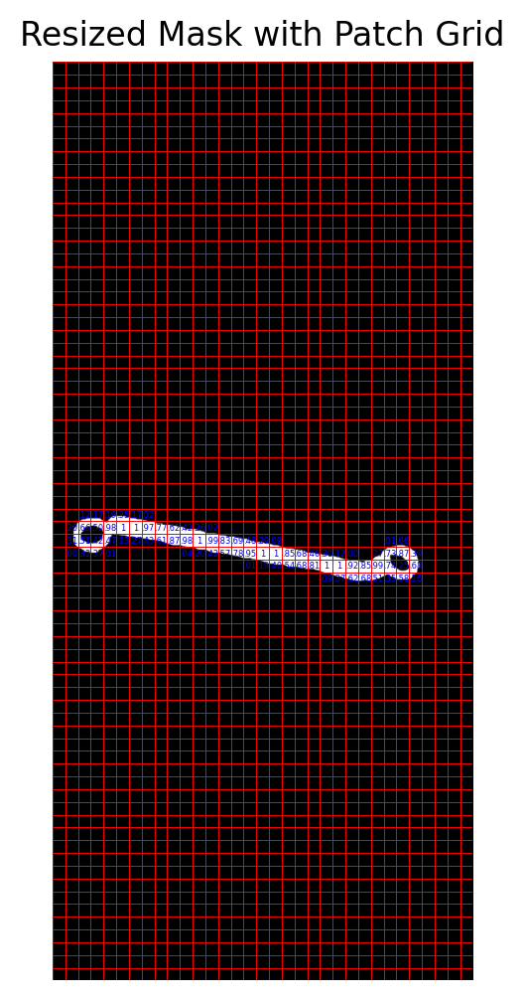

In [11]:
import matplotlib.patches as patches

# Plot with grid overlay
plt.figure(figsize=(6, 6), dpi=200)
plt.imshow(mask_0_resized.squeeze().numpy(), cmap="gray")
plt.axis("off")
plt.title("Resized Mask with Patch Grid")

h, w = mask_0_resized.shape[1:]
for y in range(0, h, PATCH_SIZE):
    for x in range(0, w, PATCH_SIZE):
        rect = patches.Rectangle((x, y), PATCH_SIZE, PATCH_SIZE,
                                 linewidth=0.3, edgecolor="red", facecolor="none")

        # Prosentandel av "foreground" i denne patchen        
        foreground_present = mask_0_quantized[y // PATCH_SIZE, x // PATCH_SIZE]

        # Vise bare tekst hvis det er noe "foreground" i patchen
        if foreground_present != 0:
            rect_text = f"{foreground_present:.2f}" # Tar med to desimaler
            
            # Formatere teksten for å unngå store tall som 0.07 eller 1.00 etc.
            # Splitter teksten ved desimalpunktet, vi får tilbake en liste med to elementer for eksempel 0.07 --> ["0", "07"]
            rect_text_split = rect_text.split(".")
            if rect_text_split[0] == "0":
                rect_text = f".{rect_text_split[1]}"
            elif rect_text_split[0] == "1":
                rect_text = f"{rect_text_split[0]}"
            else:
                rect_text = f"{rect_text_split[0]}.{rect_text_split[1]}"

            plt.text(x + PATCH_SIZE / 2, y + PATCH_SIZE / 2, rect_text,
                    color="blue", fontsize=3, ha="center", va="center")
        plt.gca().add_patch(rect)


plt.show()

In [12]:
# Vi kan printe litt informasjon om modellen
print(model)

DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (rope_embed): RopePositionEmbedding()
  (blocks): ModuleList(
    (0-11): 12 x SelfAttentionBlock(
      (norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (attn): SelfAttention(
        (qkv): LinearKMaskedBias(in_features=768, out_features=2304, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (ls2): LayerScale()
    )
  )
  (norm): LayerN

Processing images:   0%|          | 0/10 [00:00<?, ?it/s]

Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


feature fra siste lag: tensor([[[[-0.1621, -0.2589, -0.1858,  ..., -0.1505, -0.1422, -0.2391],
          [-0.1165,  0.0073,  0.0365,  ..., -0.2365, -0.2746, -0.2437],
          [ 0.0258,  0.0284,  0.0248,  ..., -0.2547, -0.2562, -0.2166],
          ...,
          [ 0.0987,  0.2331,  0.2991,  ...,  0.0734,  0.1530,  0.0399],
          [ 0.0398,  0.2712,  0.3110,  ...,  0.2918,  0.2127, -0.0304],
          [ 0.2140,  0.2435,  0.2380,  ...,  0.3333,  0.2890, -0.1065]],

         [[-0.1821, -0.1318, -0.0875,  ...,  0.1220,  0.0032, -0.0505],
          [-0.2320, -0.1645, -0.0420,  ...,  0.2504,  0.3246,  0.1141],
          [-0.2148, -0.1208, -0.0814,  ...,  0.2011,  0.2377,  0.0887],
          ...,
          [-0.0721,  0.0222,  0.1089,  ...,  0.0038, -0.1194, -0.1969],
          [-0.1519,  0.0412,  0.0775,  ..., -0.1728, -0.1493, -0.2871],
          [ 0.0053,  0.1227,  0.1837,  ..., -0.0921, -0.0988, -0.1300]],

         [[ 0.3180,  0.0020, -0.0901,  ..., -0.0442, -0.1685,  0.0346],
       

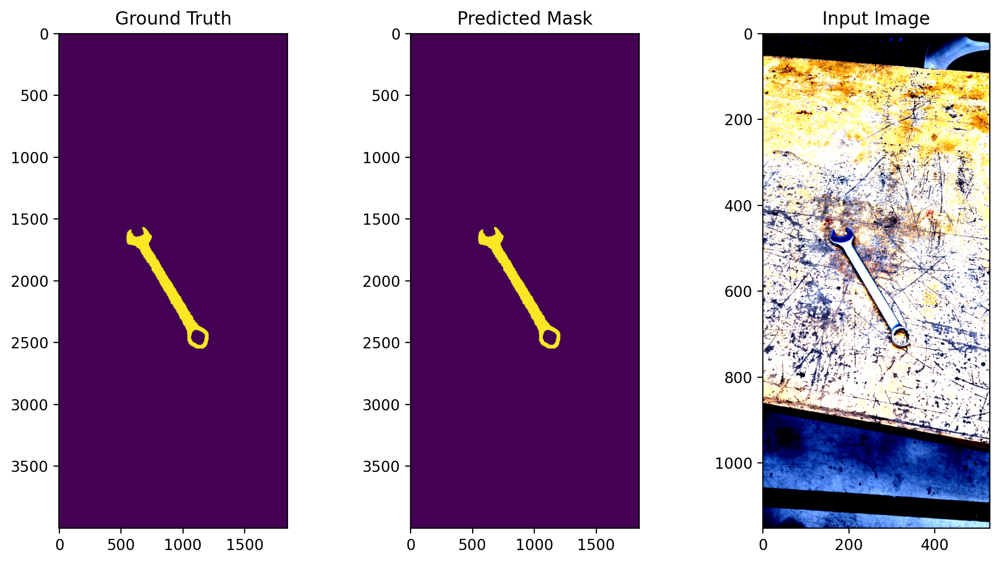

Processing images:  10%|█         | 1/10 [00:02<00:18,  2.02s/it]

torch.Size([2376, 768])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


feature fra siste lag: tensor([[[[-0.3229, -0.2637, -0.2777,  ..., -0.2165, -0.2229, -0.1477],
          [-0.2901, -0.2225, -0.1468,  ..., -0.1924, -0.2856, -0.1588],
          [-0.2117, -0.2400, -0.2067,  ..., -0.0806, -0.2030, -0.1862],
          ...,
          [ 0.3072,  0.3361,  0.4318,  ...,  0.2228,  0.2015,  0.1871],
          [ 0.2646,  0.3633,  0.3462,  ...,  0.3038,  0.1843,  0.0246],
          [ 0.3565,  0.4490,  0.4391,  ...,  0.3533,  0.0588,  0.0206]],

         [[-0.0211,  0.0739,  0.0734,  ...,  0.0139, -0.0275, -0.0994],
          [ 0.0108,  0.1418,  0.0562,  ...,  0.0414, -0.0637, -0.0477],
          [-0.1543,  0.0706,  0.0582,  ...,  0.0256,  0.0056,  0.0663],
          ...,
          [-0.0161,  0.0390,  0.0028,  ..., -0.4347, -0.3825, -0.3297],
          [-0.0290, -0.0145,  0.0068,  ..., -0.4102, -0.3815, -0.3895],
          [ 0.0026, -0.0556,  0.0487,  ..., -0.3988, -0.4430, -0.3708]],

         [[ 0.4231,  0.3643,  0.2024,  ..., -0.0178, -0.0864, -0.0811],
       

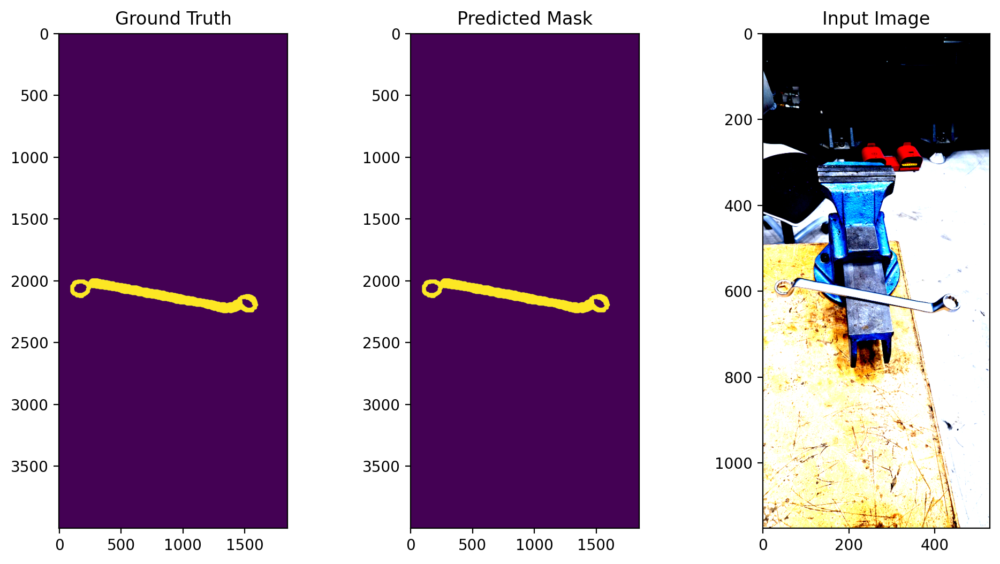

Processing images:  20%|██        | 2/10 [00:04<00:16,  2.05s/it]

torch.Size([2376, 768])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.64].


feature fra siste lag: tensor([[[[ 1.3182e-01,  1.1087e-01,  1.4744e-01,  ..., -1.6707e-01,
           -2.2810e-01, -5.8268e-02],
          [-1.9596e-04,  8.9838e-02,  1.4065e-01,  ..., -3.8954e-02,
           -1.8267e-01, -1.1436e-01],
          [ 2.3286e-01,  1.4144e-01,  2.1905e-01,  ..., -2.0763e-02,
           -5.7469e-02, -2.1297e-01],
          ...,
          [ 7.0653e-03,  1.0827e-01,  1.3410e-01,  ...,  3.7793e-01,
            1.8402e-01,  2.1421e-01],
          [ 2.0109e-02, -3.0399e-02,  1.0716e-01,  ...,  3.7643e-01,
            3.3292e-01,  2.6704e-01],
          [ 6.9518e-02,  8.4252e-02,  1.0570e-01,  ...,  4.2173e-01,
            3.0680e-01,  2.4838e-01]],

         [[ 6.9252e-02,  3.9024e-02,  4.9541e-02,  ...,  1.4793e-01,
            1.3717e-01,  6.3973e-03],
          [ 5.3431e-02,  1.1395e-01,  9.3847e-02,  ...,  9.3776e-02,
            7.9395e-02,  1.5407e-02],
          [ 2.2443e-01,  4.5778e-02,  1.7151e-02,  ...,  9.9358e-02,
            7.6925e-02,  9.4142e-02

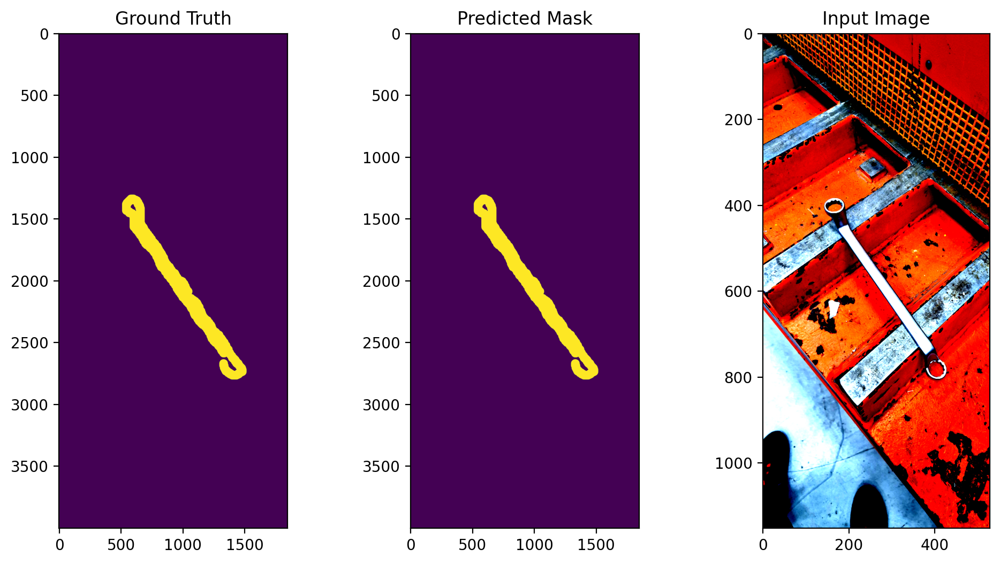

Processing images:  30%|███       | 3/10 [00:06<00:14,  2.01s/it]

torch.Size([2376, 768])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.64].


feature fra siste lag: tensor([[[[ 2.4587e-01, -5.5365e-02, -1.2224e-01,  ..., -2.7382e-01,
           -2.6420e-01, -9.6703e-02],
          [ 3.0106e-01,  1.2492e-02,  4.0228e-02,  ..., -1.1578e-01,
           -2.0201e-01, -2.2146e-01],
          [ 1.4463e-02,  1.0917e-01,  9.2719e-02,  ..., -7.2533e-02,
           -1.1287e-01, -1.9490e-01],
          ...,
          [ 2.7047e-01,  3.6345e-01,  2.9845e-01,  ...,  5.4609e-03,
           -8.7067e-03, -5.3641e-02],
          [ 4.5595e-01,  5.4720e-01,  3.9971e-01,  ...,  1.0760e-01,
            3.9254e-02, -9.2329e-02],
          [ 3.5993e-01,  4.3447e-01,  4.3570e-01,  ...,  2.3355e-01,
            3.3324e-02, -2.2655e-01]],

         [[-6.8127e-02,  2.1883e-04, -3.6976e-02,  ..., -2.4262e-01,
           -2.2252e-01, -2.5818e-01],
          [-1.3325e-01, -7.4947e-02, -4.0268e-02,  ..., -2.5531e-01,
           -2.3347e-01, -1.9078e-01],
          [-8.5492e-02, -8.1310e-02, -5.2038e-02,  ..., -2.2757e-01,
           -2.4257e-01, -1.7247e-01

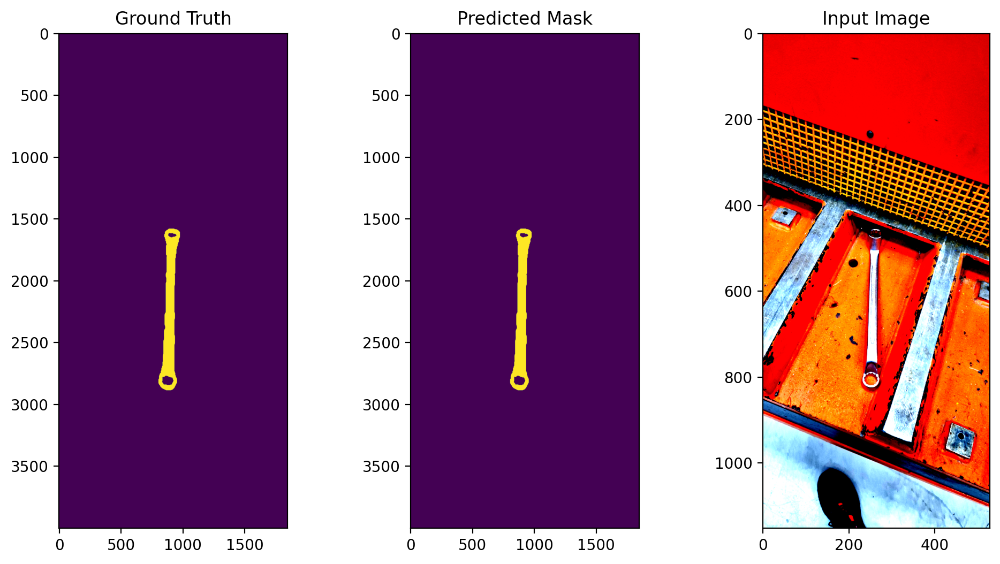

Processing images:  40%|████      | 4/10 [00:07<00:11,  1.93s/it]

torch.Size([2376, 768])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


feature fra siste lag: tensor([[[[-0.0415, -0.0425, -0.0348,  ...,  0.0272,  0.0068, -0.1609],
          [ 0.0888, -0.0165,  0.1347,  ...,  0.0414,  0.0190, -0.0473],
          [ 0.0841,  0.0837,  0.0769,  ...,  0.0483,  0.0348, -0.1763],
          ...,
          [-0.1246, -0.0845,  0.0806,  ...,  0.2926,  0.2140,  0.1366],
          [-0.0526, -0.0285,  0.1175,  ...,  0.3058,  0.3481,  0.2932],
          [ 0.0030,  0.0158,  0.1012,  ...,  0.4184,  0.3707,  0.0182]],

         [[-0.3517, -0.4077, -0.3515,  ..., -0.4799, -0.4187, -0.3574],
          [-0.4551, -0.4077, -0.4215,  ..., -0.5174, -0.4175, -0.3703],
          [-0.4798, -0.3510, -0.4645,  ..., -0.2838, -0.4372, -0.2633],
          ...,
          [ 0.0383,  0.0962, -0.0485,  ..., -0.3665, -0.3851, -0.3385],
          [ 0.0761,  0.0782, -0.0878,  ..., -0.3720, -0.3976, -0.3320],
          [ 0.0841, -0.0075, -0.0456,  ..., -0.4037, -0.4071, -0.3223]],

         [[-0.1729, -0.3598,  0.2008,  ..., -0.1920, -0.1588, -0.0785],
       

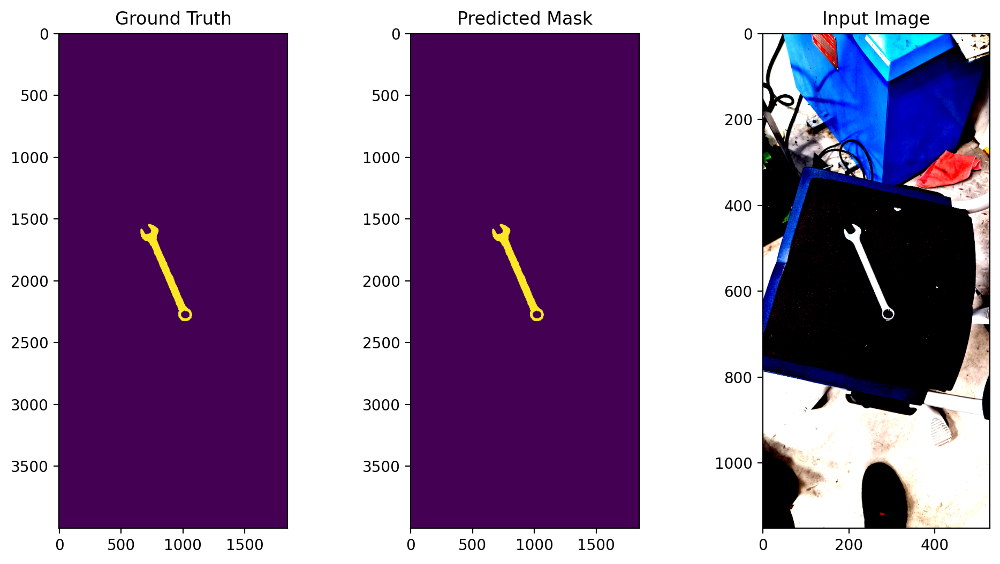

Processing images:  50%|█████     | 5/10 [00:09<00:09,  1.92s/it]

torch.Size([2376, 768])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.622571].


feature fra siste lag: tensor([[[[-2.3941e-01, -1.1103e-01, -1.4422e-01,  ..., -2.0649e-01,
           -8.9072e-02, -2.2544e-01],
          [-1.0888e-01, -2.6576e-02,  1.0087e-01,  ..., -2.2232e-01,
           -2.5296e-02, -2.9571e-01],
          [-1.6890e-01,  7.2489e-02,  1.1990e-01,  ..., -1.0924e-01,
            3.3203e-02, -2.6494e-01],
          ...,
          [ 3.5502e-01,  1.7239e-01,  3.7570e-01,  ...,  1.3508e-01,
           -1.1452e-02, -2.7215e-02],
          [ 2.0639e-01,  9.6115e-02,  2.9970e-01,  ...,  1.3322e-01,
            9.1913e-02, -3.8713e-02],
          [ 1.8230e-01,  1.3955e-01,  4.0494e-01,  ...,  8.8541e-02,
            2.2676e-03,  2.1036e-01]],

         [[-3.8543e-03,  1.0553e-01,  1.1309e-01,  ...,  1.6352e-01,
            3.0120e-02,  3.7314e-02],
          [-3.6367e-02,  9.1674e-02,  3.6570e-02,  ...,  1.1447e-01,
            9.8129e-02,  1.2175e-01],
          [-7.8202e-02, -3.6139e-02,  9.2753e-02,  ...,  2.7746e-02,
            1.1809e-01,  1.7673e-01

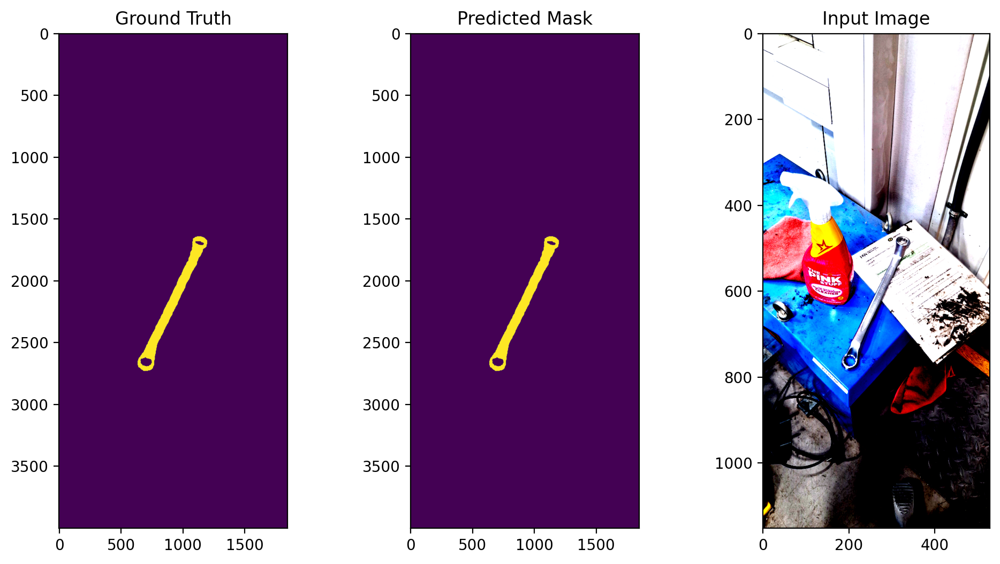

Processing images:  60%|██████    | 6/10 [00:11<00:07,  1.96s/it]

torch.Size([2376, 768])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


feature fra siste lag: tensor([[[[-0.0984, -0.1657, -0.0750,  ..., -0.4995, -0.5000, -0.3948],
          [-0.0624, -0.0173,  0.0388,  ..., -0.4089, -0.4229, -0.4432],
          [-0.0866,  0.2044,  0.2171,  ..., -0.2337, -0.3430, -0.4114],
          ...,
          [ 0.1783,  0.1705,  0.1915,  ...,  0.4603,  0.3360,  0.2832],
          [ 0.1734,  0.2416,  0.2060,  ...,  0.3453,  0.3576,  0.1491],
          [ 0.1080,  0.1359,  0.2449,  ...,  0.4063,  0.2640,  0.2264]],

         [[-0.3092, -0.2934, -0.2164,  ...,  0.1009,  0.1683,  0.0963],
          [-0.3377, -0.3044, -0.1963,  ...,  0.1843,  0.1130,  0.1940],
          [-0.3244, -0.2353, -0.1412,  ...,  0.0969,  0.1192,  0.4853],
          ...,
          [-0.2445, -0.3344, -0.3026,  ..., -0.4133, -0.4836, -0.4590],
          [-0.2138, -0.2457, -0.3348,  ..., -0.4795, -0.5075, -0.3613],
          [-0.2660, -0.2575, -0.3578,  ..., -0.4372, -0.4375, -0.3264]],

         [[-0.0904, -0.0616, -0.1618,  ...,  0.2190, -0.0429,  0.0049],
       

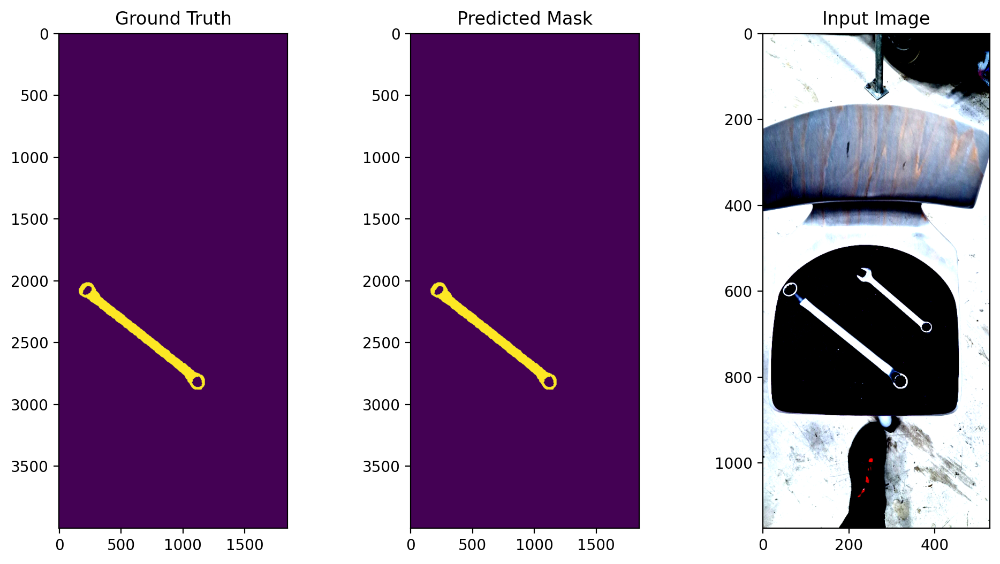

Processing images:  70%|███████   | 7/10 [00:13<00:05,  1.94s/it]

torch.Size([2376, 768])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


feature fra siste lag: tensor([[[[-0.0984, -0.1657, -0.0750,  ..., -0.4995, -0.5000, -0.3948],
          [-0.0624, -0.0173,  0.0388,  ..., -0.4089, -0.4229, -0.4432],
          [-0.0866,  0.2044,  0.2171,  ..., -0.2337, -0.3430, -0.4114],
          ...,
          [ 0.1783,  0.1705,  0.1915,  ...,  0.4603,  0.3360,  0.2832],
          [ 0.1734,  0.2416,  0.2060,  ...,  0.3453,  0.3576,  0.1491],
          [ 0.1080,  0.1359,  0.2449,  ...,  0.4063,  0.2640,  0.2264]],

         [[-0.3092, -0.2934, -0.2164,  ...,  0.1009,  0.1683,  0.0963],
          [-0.3377, -0.3044, -0.1963,  ...,  0.1843,  0.1130,  0.1940],
          [-0.3244, -0.2353, -0.1412,  ...,  0.0969,  0.1192,  0.4853],
          ...,
          [-0.2445, -0.3344, -0.3026,  ..., -0.4133, -0.4836, -0.4590],
          [-0.2138, -0.2457, -0.3348,  ..., -0.4795, -0.5075, -0.3613],
          [-0.2660, -0.2575, -0.3578,  ..., -0.4372, -0.4375, -0.3264]],

         [[-0.0904, -0.0616, -0.1618,  ...,  0.2190, -0.0429,  0.0049],
       

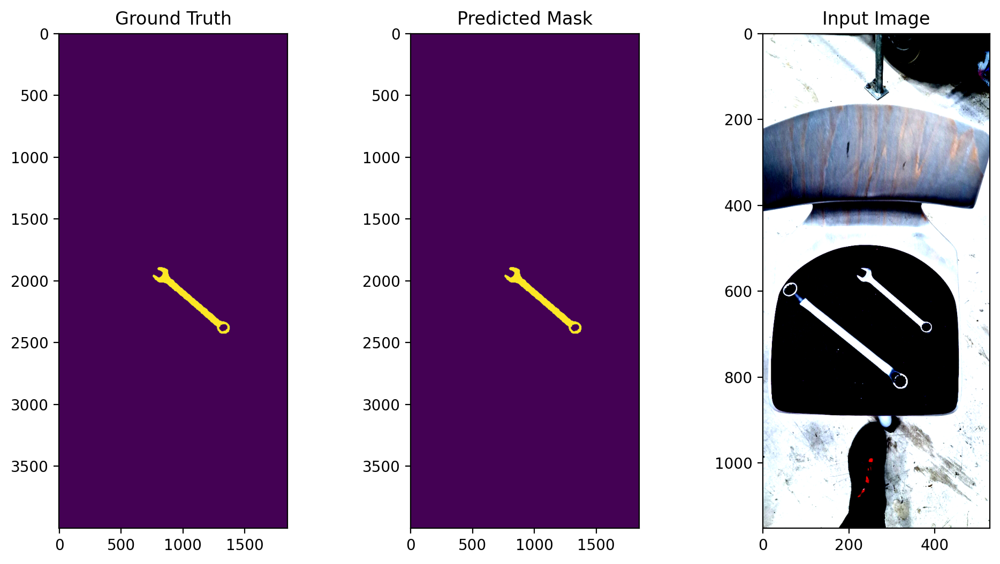

Processing images:  80%|████████  | 8/10 [00:15<00:03,  1.89s/it]

torch.Size([2376, 768])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.622571].


feature fra siste lag: tensor([[[[-0.4511, -0.3746, -0.3260,  ..., -0.2363, -0.3035, -0.6011],
          [-0.4356, -0.1899, -0.1903,  ..., -0.4691, -0.2027, -0.5664],
          [-0.3117, -0.0483, -0.0536,  ..., -0.0471, -0.1998, -0.5130],
          ...,
          [ 0.2994,  0.3593,  0.3107,  ...,  0.1306,  0.0952,  0.0129],
          [ 0.3839,  0.2996,  0.3058,  ...,  0.2201,  0.2054, -0.0105],
          [ 0.4988,  0.3522,  0.3101,  ...,  0.1918,  0.1443,  0.1021]],

         [[-0.1901, -0.2164, -0.1871,  ..., -0.3225, -0.3533, -0.3886],
          [-0.2375, -0.2506, -0.2373,  ..., -0.2880, -0.3338, -0.3271],
          [-0.3310, -0.2735, -0.3093,  ..., -0.2966, -0.3376, -0.3039],
          ...,
          [-0.0708, -0.0446,  0.0660,  ..., -0.0551, -0.1397, -0.0515],
          [-0.0456, -0.0410,  0.0238,  ..., -0.0184, -0.1161, -0.0280],
          [-0.0964,  0.0058,  0.0241,  ..., -0.0592, -0.0291, -0.0245]],

         [[-0.2415, -0.1370, -0.0619,  ..., -0.1293, -0.2474, -0.2775],
       

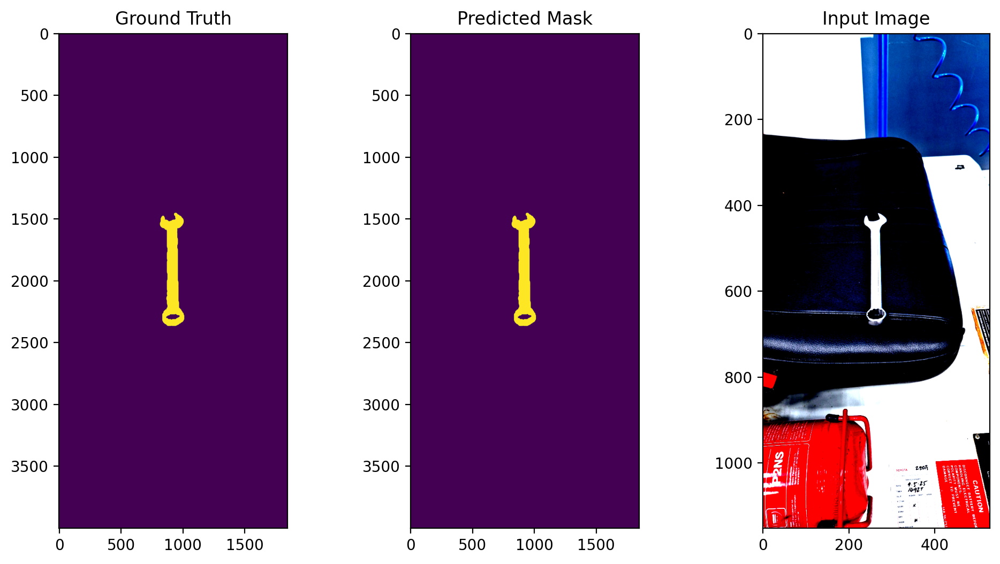

Processing images:  90%|█████████ | 9/10 [00:17<00:01,  1.92s/it]

torch.Size([2376, 768])
Feature map shape: 12, type: <class 'tuple'>
Siste tensor shape: [torch.Size([1, 768, 72, 33])]
dim = 768
Feature map shape: torch.Size([1, 768, 72, 33])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].


feature fra siste lag: tensor([[[[-0.2513, -0.3140, -0.3393,  ..., -0.2637, -0.3511, -0.3476],
          [-0.2596, -0.1934, -0.2536,  ..., -0.1718, -0.2741, -0.3963],
          [-0.1224, -0.1715, -0.2127,  ..., -0.0788, -0.2327, -0.3343],
          ...,
          [ 0.3634,  0.1873,  0.2832,  ...,  0.1852,  0.0337, -0.1716],
          [ 0.3896,  0.2142,  0.2376,  ...,  0.1792,  0.0462, -0.1902],
          [ 0.3579,  0.3712,  0.3805,  ...,  0.3262,  0.0799, -0.0343]],

         [[-0.3024, -0.1916, -0.1056,  ..., -0.3983, -0.2952, -0.3788],
          [-0.1638, -0.1038, -0.0979,  ..., -0.3429, -0.3306, -0.2280],
          [-0.1140, -0.0962, -0.0592,  ..., -0.3692, -0.2769, -0.2329],
          ...,
          [-0.2621, -0.2317, -0.2240,  ..., -0.4224, -0.4599, -0.3542],
          [-0.2789, -0.2025, -0.2165,  ..., -0.4102, -0.4065, -0.3276],
          [-0.2764, -0.1773, -0.1984,  ..., -0.3299, -0.3192, -0.3196]],

         [[ 0.0941,  0.1988, -0.0806,  ..., -0.2274, -0.3844,  0.0255],
       

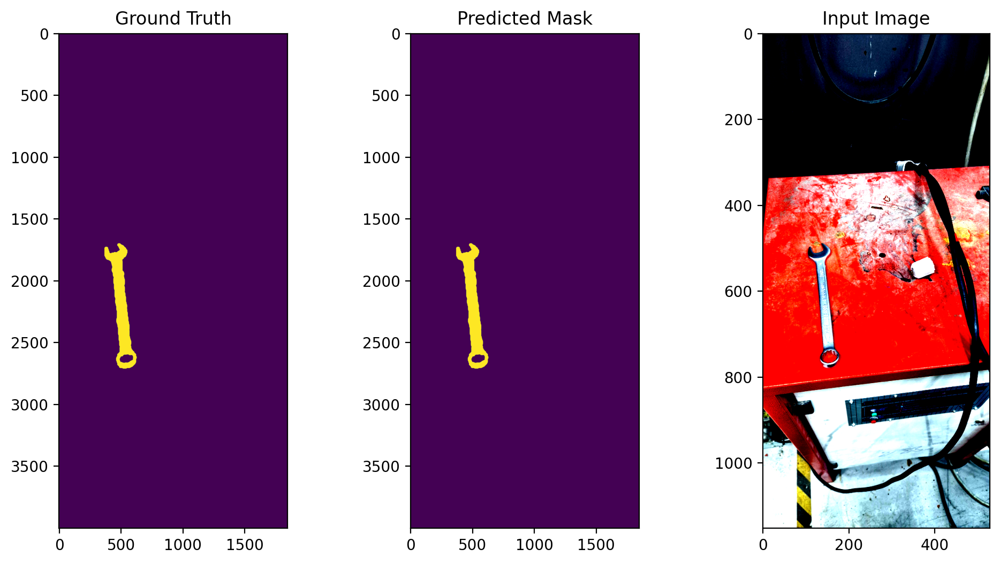

Processing images: 100%|██████████| 10/10 [00:19<00:00,  1.94s/it]

torch.Size([2376, 768])
Design matrix of size :  torch.Size([23206, 768])
Label matrix of size :  torch.Size([23206])


In [13]:
xs = []
ys = []
image_index = []

IMAGENET_MEAN = (0.485, 0.456, 0.406) # RGB mean for ImageNet
IMAGENET_STD = (0.229, 0.224, 0.225) # RGB std for ImageNet

# Self-attention lagene i DINOv3 ViT modellene
MODEL_TO_NUM_LAYERS = {
    MODEL_DINOV3_VITS: 12,
    MODEL_DINOV3_VITSP: 12,
    MODEL_DINOV3_VITB: 12,
    MODEL_DINOV3_VITL: 24,
    MODEL_DINOV3_VITHP: 32,
    MODEL_DINOV3_VIT7B: 40,
}

n_layers = MODEL_TO_NUM_LAYERS[MODEL_NAME]

# 
with torch.inference_mode():
    with torch.autocast(device_type='cuda', dtype=torch.float32):
        for i in tqdm(range(n_images), desc="Processing images"):

            # Loading the ground truth
            mask_i = labels[i].split()[-1]
            mask_i_resized = resize_transform(mask_i)
            mask_i_quantized = patch_quant_filter(mask_i_resized).squeeze().view(-1).detach().cpu()
            ys.append(mask_i_quantized)
            
            # Loading the image data 
            image_i = images[i].convert('RGB')
            image_i_resized = resize_transform(image_i)
            image_i_resized = TF.normalize(image_i_resized, mean=IMAGENET_MEAN, std=IMAGENET_STD)
            image_i_resized = image_i_resized.unsqueeze(0).cuda()

            # tar ut features fra alle lag i modellen
            # feats blir en liste med feature tensorer fra hvert lag
            # Forklaring av tensor: 
            # en tensor er (N, D, H, W) der N=1 (batch size), D=dimensjon på features, H og W er romlige dimensjoner
            feats = model.get_intermediate_layers(image_i_resized, n=range(n_layers), reshape=True, norm=True)
            
            print(f"Feature map shape: {len(feats)}, type: {type(feats)}")
            print(f"Siste tensor shape: {[feats[-1].shape]}")

            # tar med features fra siste lag
            # Vi endrer formen på tensoren slik at vi får en rad per patch
            # feats[-1] er siste lag, som har formen (1, D, H, W)
            dim = feats[-1].shape[1]

            print(f"dim = {dim}")
            print(f"Feature map shape: {feats[0].shape}")
            print(f"feature fra siste lag: {feats[-1]}")

            xs.append(feats[-1].squeeze().view(dim, -1).permute(1,0).detach().cpu())

            image_index.append(i * torch.ones(ys[-1].shape))

             # Visualization of ground truth, predicted mask, input image
            plt.figure(figsize=(12, 6), dpi=200)
            plt.subplot(1, 3, 1)
            plt.imshow(labels[i])
            plt.title("Ground Truth")
            
            plt.subplot(1, 3, 2)
            plt.imshow(mask_i)
            plt.title("Predicted Mask")

            plt.subplot(1, 3, 3)
            plt.imshow(image_i_resized.squeeze().permute(1,2,0).detach().cpu())
            plt.title("Input Image")
    
            plt.show()

            print(xs[i].shape)

# Concatenate all lists into torch tensors 
xs = torch.cat(xs)
ys = torch.cat(ys)
image_index = torch.cat(image_index)

# keeping only the patches that have clear positive or negative label
idx = (ys < 0.01) | (ys > 0.99)
xs = xs[idx]
ys = ys[idx]
image_index = image_index[idx]

print("Design matrix of size : ", xs.shape)
print("Label matrix of size : ", ys.shape)


validation using image_01.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


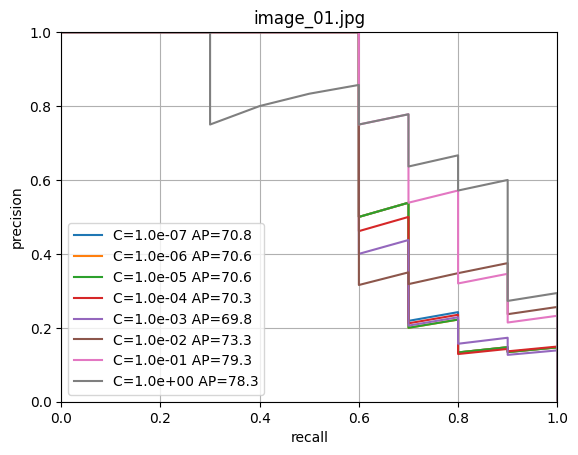

validation using image_02.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


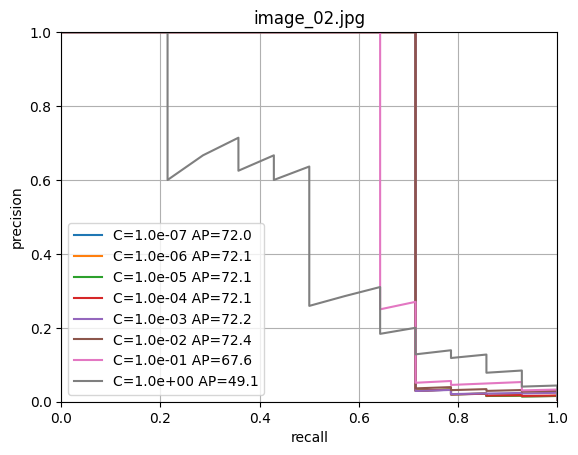

validation using image_03.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


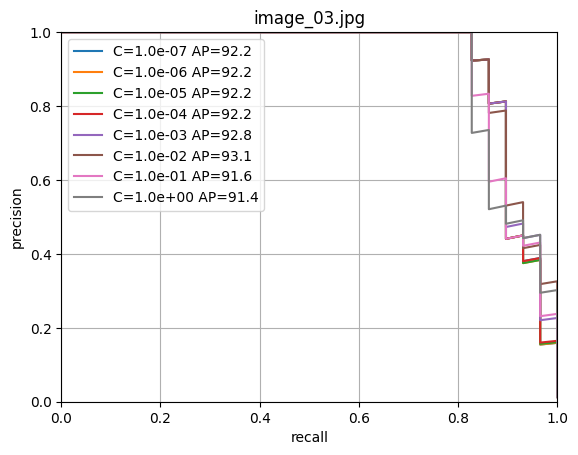

validation using image_04.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


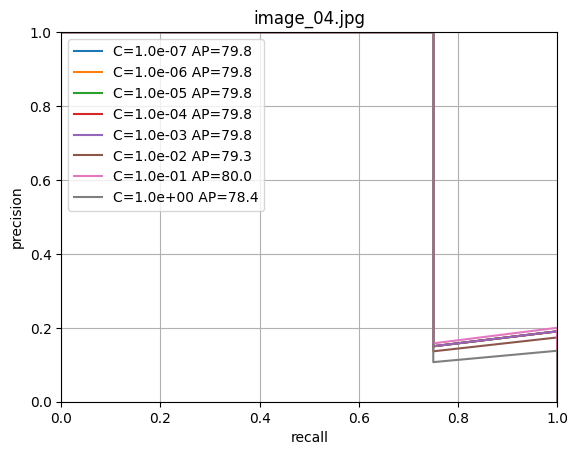

validation using image_05.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


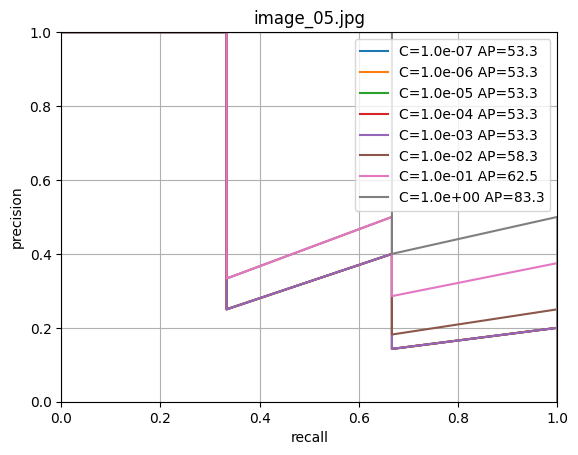

validation using image_06.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


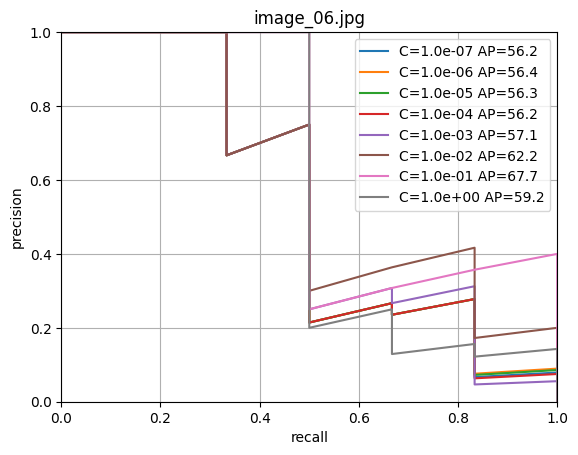

validation using image_07.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


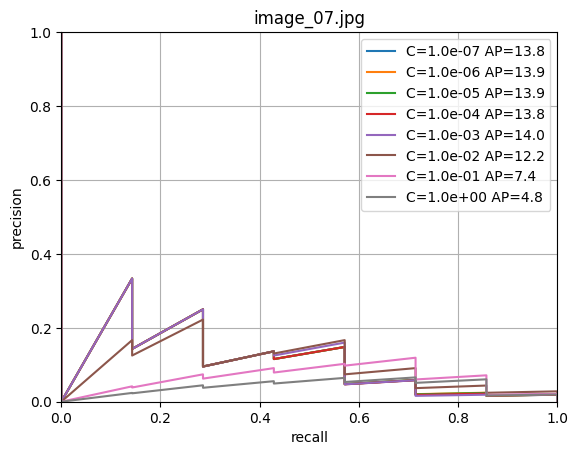

validation using image_08.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


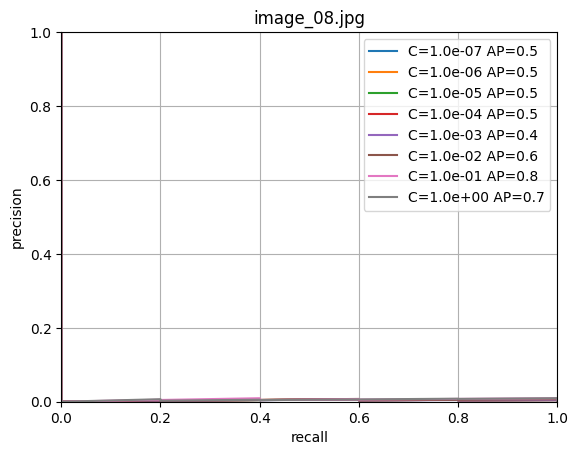

validation using image_09.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


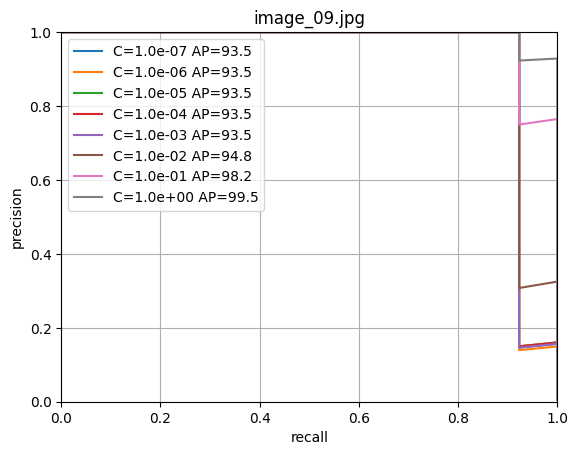

validation using image_10.jpg
training logisitic regression with C=1.00e-07
training logisitic regression with C=1.00e-06
training logisitic regression with C=1.00e-05
training logisitic regression with C=1.00e-04
training logisitic regression with C=1.00e-03
training logisitic regression with C=1.00e-02
training logisitic regression with C=1.00e-01
training logisitic regression with C=1.00e+00


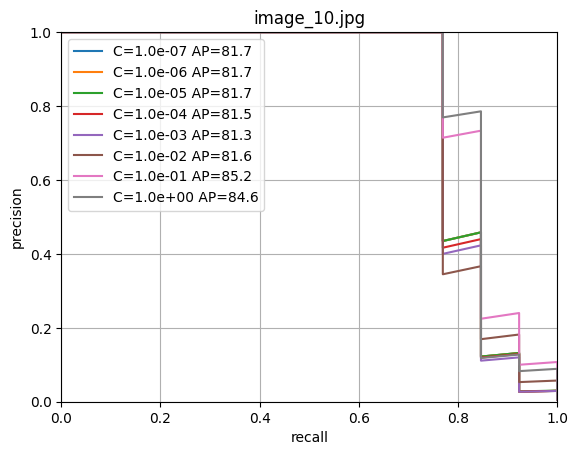

In [14]:
cs = np.logspace(-7, 0, 8)
scores = np.zeros((n_images, len(cs)))

for i in range(n_images):
    # We use leave-one-out so train will be all but image i, val will be image i
    print('validation using image_{:02d}.jpg'.format(i+1))
    train_selection = image_index != float(i)
    fold_x = xs[train_selection].numpy()
    fold_y = (ys[train_selection] > 0).long().numpy()
    val_x = xs[~train_selection].numpy()
    val_y = (ys[~train_selection] > 0).long().numpy()

    plt.figure()
    for j, c in enumerate(cs):
        print("training logisitic regression with C={:.2e}".format(c))
        clf = LogisticRegression(random_state=0, C=c, max_iter=10000).fit(fold_x, fold_y)
        output = clf.predict_proba(val_x)
        precision, recall, thresholds = precision_recall_curve(val_y, output[:, 1])
        s = average_precision_score(val_y, output[:, 1])
        scores[i, j] = s
        plt.plot(recall, precision, label='C={:.1e} AP={:.1f}'.format(c, s*100))

    plt.grid()
    plt.xlabel('recall')
    plt.title('image_{:02d}.jpg'.format(i+1))
    plt.ylabel('precision')
    plt.axis([0, 1, 0, 1])
    plt.legend()
    plt.show()


In [15]:
print(len(scores))
print(scores.shape)
print(scores)

print(np.max(scores, axis=1))

10
(10, 8)
[[0.70754856 0.70552836 0.70552836 0.7027405  0.69780372 0.73292363
  0.79279183 0.78290383]
 [0.72046394 0.72052086 0.72052223 0.72062314 0.72159013 0.72390282
  0.67585681 0.4910889 ]
 [0.92195364 0.92176994 0.92183099 0.92214095 0.9275429  0.93116861
  0.91573995 0.91415558]
 [0.79761905 0.79761905 0.79761905 0.79761905 0.79761905 0.79347826
  0.8        0.78448276]
 [0.53333333 0.53333333 0.53333333 0.53333333 0.53333333 0.58333333
  0.625      0.83333333]
 [0.56223197 0.56399945 0.56335979 0.56157407 0.57095798 0.62171717
  0.67747253 0.59151786]
 [0.13831115 0.13862038 0.13850739 0.13812594 0.1396477  0.12210519
  0.07441461 0.04773795]
 [0.00463218 0.00476765 0.0047466  0.00479905 0.00442816 0.00568263
  0.0077248  0.00730429]
 [0.93512512 0.93457118 0.9354226  0.9354226  0.93512512 0.94807692
  0.98190045 0.99450549]
 [0.81688313 0.81687807 0.81695107 0.81527521 0.81324807 0.8158272
  0.85236703 0.84633961]]
[0.79279183 0.72390282 0.93116861 0.8        0.83333333 0.6

1.0


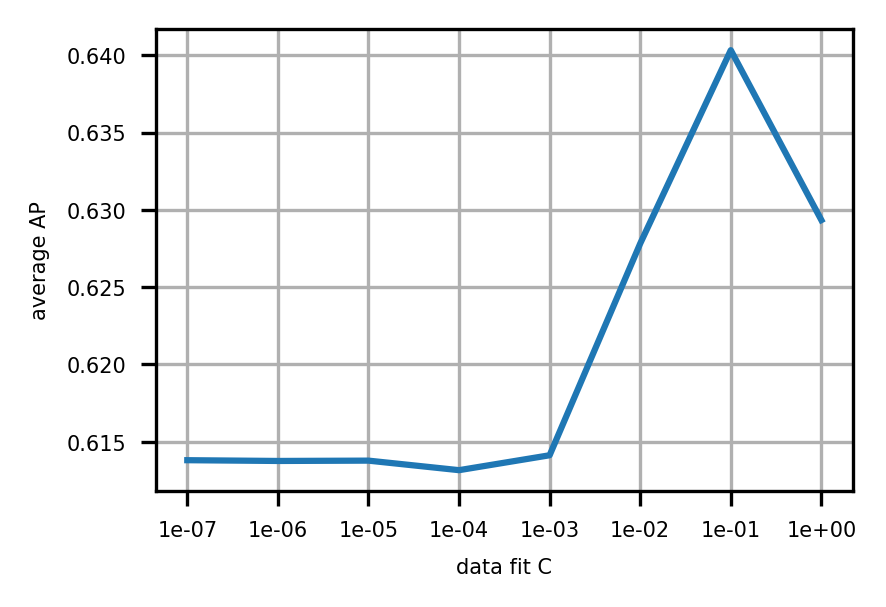

In [16]:
plt.figure(figsize=(3, 2), dpi=300)
plt.rcParams.update({
    "xtick.labelsize": 5,
    "ytick.labelsize": 5,
    "axes.labelsize": 5,
})

print(c)
plt.plot(scores.mean(axis=0))
plt.xticks(np.arange(len(cs)), ["{:.0e}".format(c) for c in cs])
plt.xlabel('data fit C')
plt.ylabel('average AP')
plt.grid()
plt.show()

In [17]:
print(xs.shape)
print(ys.shape)


torch.Size([23206, 768])
torch.Size([23206])


In [18]:
clf = LogisticRegression(random_state=0, C=0.1, max_iter=100000, verbose=2).fit(xs.numpy(), (ys > 0).long().numpy())

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished


Loaded 20250925_100944.jpg from ./Testedata
Loaded 20250925_101022.jpg from ./Testedata
Loaded 20250925_101026.jpg from ./Testedata
Loaded 20250925_101036.jpg from ./Testedata
Loaded 20250925_101057.jpg from ./Testedata
Loaded 20250925_101332.jpg from ./Testedata
Loaded 20250925_101337.jpg from ./Testedata
Loaded images (1).jpg from ./Testedata
Loaded images (2).jpg from ./Testedata
Loaded images (3).jpg from ./Testedata
Loaded images (4).jpg from ./Testedata
Loaded images (5).jpg from ./Testedata
Loaded images (6).jpg from ./Testedata
Loaded images.jpg from ./Testedata
Total images loaded from ./Testedata: 14



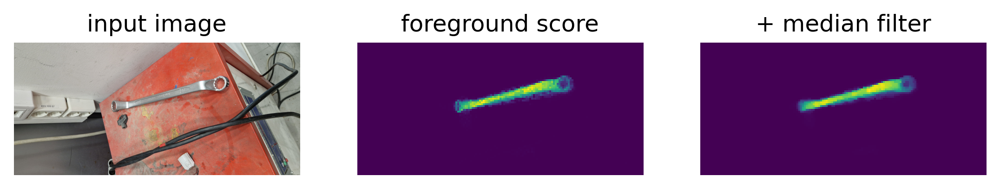

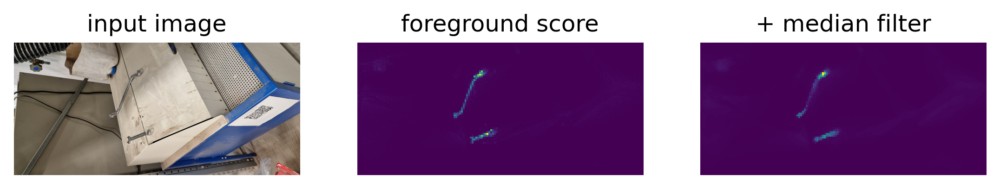

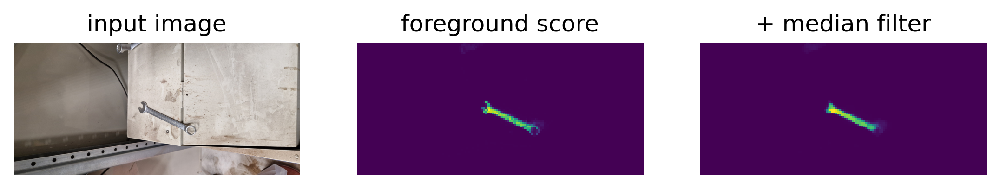

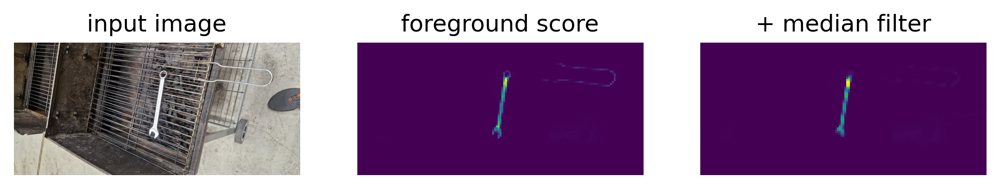

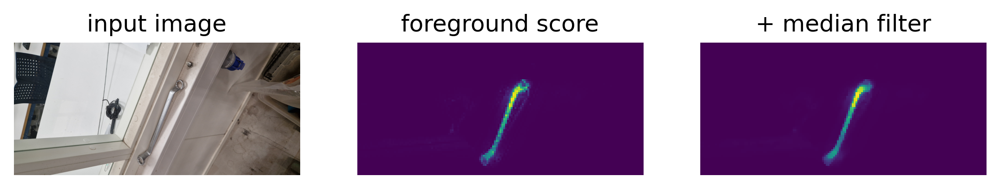

...

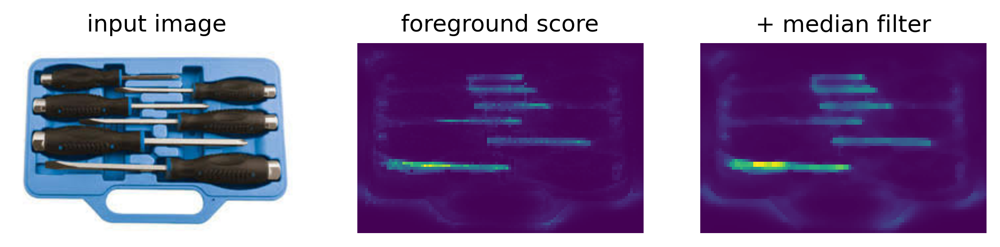

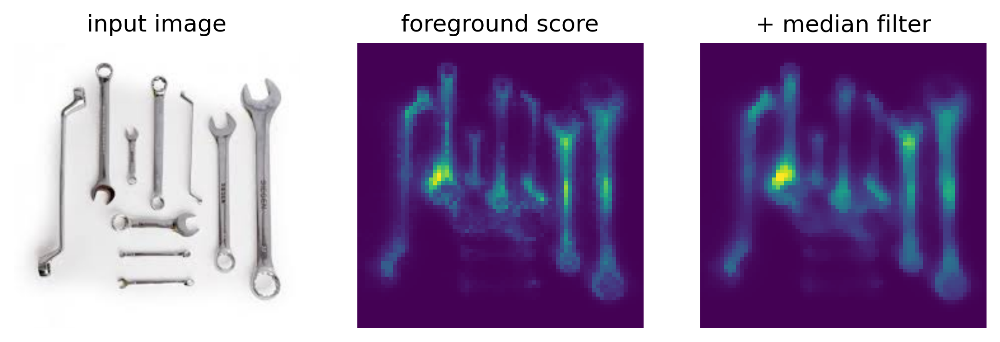

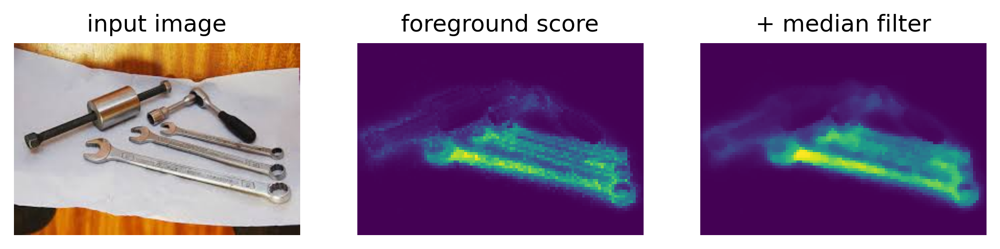

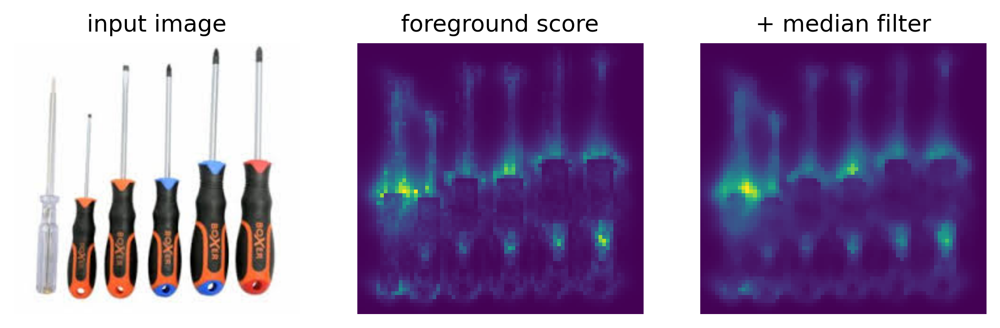

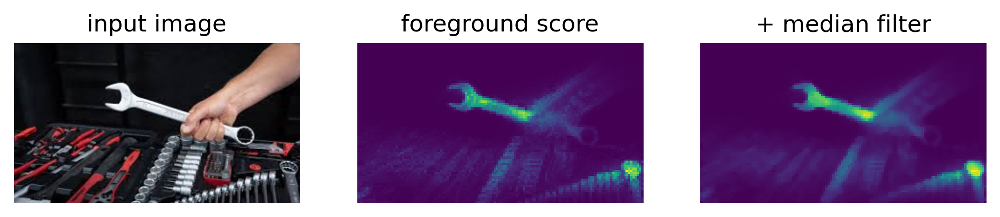

In [19]:
test_image_fpath = "./Testedata"
test_image_fpath= "./Testedata"
def load_image_from_url(url: str) -> Image:
    with urllib.request.urlopen(url) as f:
        return Image.open(f).convert("RGB")

test_folder = "./Testedata"

def load_images_from_folder(folder: str) -> list[Image.Image]:
    images = []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            img = Image.open(os.path.join(folder, filename))
            images.append(img)
            print(f"Loaded {filename} from {folder}")

    print(f"Total images loaded from {folder}: {len(images)}\n")
    return images

test_images = load_images_from_folder(test_folder)

def testData(image):
    test_image = image

    test_image_resized = resize_transform(test_image)
    test_image_normalized = TF.normalize(test_image_resized, mean=IMAGENET_MEAN, std=IMAGENET_STD)

    with torch.inference_mode():
        with torch.autocast(device_type='cuda', dtype=torch.float32):
            feats = model.get_intermediate_layers(test_image_normalized.unsqueeze(0).cuda(), n=range(n_layers), reshape=True, norm=True)
            x = feats[-1].squeeze().detach().cpu()
            dim = x.shape[0]
            x = x.view(dim, -1).permute(1, 0)

    h_patches, w_patches = [int(d / PATCH_SIZE) for d in test_image_resized.shape[1:]]

    fg_score = clf.predict_proba(x)[:, 1].reshape(h_patches, w_patches)
    fg_score_mf = torch.from_numpy(signal.medfilt2d(fg_score, kernel_size=3))

    plt.figure(figsize=(9, 3), dpi=300)
    plt.subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(test_image_resized.permute(1, 2, 0))
    plt.title('input image')
    plt.subplot(1, 3, 2)
    plt.axis('off')
    plt.imshow(fg_score)
    plt.title('foreground score')
    plt.subplot(1, 3, 3)
    plt.axis('off')
    plt.imshow(fg_score_mf)
    plt.title('+ median filter')
    plt.show()

for image in test_images:
    testData(image)
